In [97]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.cluster import DBSCAN
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn import metrics
import matplotlib.pyplot as plt
from itertools import product
import altair as alt

In [98]:
df = pd.read_csv('../../data/train_test_split/x_train.csv')
df.head()

,Unnamed: 0.1,Unnamed: 0,name,rating,ranking,year,position,height,weight,latitude,...,latitude_school,longitude_school,wins_rolling_2year,games_played_rolling_2year,post_season_wins_rolling_2year,point_diff_rolling_2year,win_pct_rolling_2year,distance_miles,side_of_ball,position_group
0,361,361,C.J. Prosise,0.8915,365.0,2012,S,74.0,190.0,35.166812,...,41.698378,-86.233942,16.0,26.0,1.0,190.0,0.615385,539.828641,defense,d_backfield
1,14685,14686,Jaylon Haynes,0.8166,1684.0,2017,DT,73.0,290.0,29.312480,...,29.416983,-98.478814,9.0,25.0,0.0,-118.0,0.360000,143.529399,defense,d_line
2,15617,15618,Nasser Clark,0.7667,3299.0,2017,RB,70.0,190.0,34.597245,...,41.387492,-73.964089,10.0,25.0,1.0,62.0,0.400000,709.669019,offense,running_back
3,3870,3870,Courtney Miggins,0.8111,1568.0,2013,SDE,77.0,240.0,33.712331,...,30.215843,-92.041737,18.0,26.0,2.0,128.0,0.692308,523.980272,defense,d_line
4,20038,20046,Zaylin Wood,0.8383,1429.0,2019,SDE,74.0,262.0,33.537889,...,35.851146,-86.368165,15.0,27.0,1.0,29.0,0.555556,171.919819,defense,d_line


In [99]:
full_df = df.merge(pd.read_csv('../../data/train_test_split/y_train.csv'), on='Unnamed: 0', how='left')
print(f"Percent of all players drafted from training set: {round(len(full_df[full_df['is_drafted'] == 1.0]) / len(full_df) * 100, 2)}%")

Percent of all players drafted from training set: 7.23%


In [100]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'name', 'rating', 'ranking', 'year',
       'position', 'height', 'weight', 'latitude', 'longitude',
       'hometown_city', 'state_province', 'hometown_country', 'stars',
       'committed_to', 'athlete_id', 'conference', 'latitude_school',
       'longitude_school', 'wins_rolling_2year', 'games_played_rolling_2year',
       'post_season_wins_rolling_2year', 'point_diff_rolling_2year',
       'win_pct_rolling_2year', 'distance_miles', 'side_of_ball',
       'position_group'],
      dtype='object')

In [101]:
# Define numerical and categorical values
numerical_features = ['rating', 'ranking', 'height', 'weight', 'distance_miles', 'stars', 'wins_rolling_2year', 'games_played_rolling_2year', 'post_season_wins_rolling_2year', 'point_diff_rolling_2year', 'win_pct_rolling_2year']
categorical_features = ['conference', 'side_of_ball', 'position_group', 'position', 'year']
target = ['is_drafted']


In [102]:
# Features and target
X = df[numerical_features+categorical_features]
#y = df[target]

In [103]:
def create_pipeline(eps=0.5, min_samples=5, metric='euclidean', alg='auto', leaf_size=30, p=None):
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numerical_features),
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
        ]
    )

    pipe = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('pca', PCA(n_components=2, random_state=42)),
        ('classifier', DBSCAN(eps=eps, min_samples=min_samples, metric=metric, algorithm=alg, leaf_size=leaf_size, p=p))
    ])
    return pipe, preprocessor

pipe, preprocessor = create_pipeline()

In [162]:
# Define parameters
eps = [0.1, 0.15,0.2,0.25, 0.3,0.35,0.4,0.45,0.5,0.55]
min_samples = [100,200,250,500,1000]

all_combos = list(product(eps, min_samples))
num_combos = len(all_combos)

data = []
for idx, (ep, min_sample) in enumerate(all_combos):
    pipe, preprocessor = create_pipeline(ep, min_sample)
    clusters = pipe.fit_predict(X)
    pca_data = pipe.named_steps['pca'].fit_transform(preprocessor.fit_transform(X))
    full_df['cluster'] = clusters

    cluster_summary = full_df.groupby('cluster')['is_drafted'].agg(['sum', 'count'])
    cluster_summary['proportion_drafted'] = cluster_summary['sum'] / cluster_summary['count']
    cluster_summary = cluster_summary.sort_values('proportion_drafted', ascending=False)
    #if len(cluster_summary) >=3 and len(cluster_summary) <=8 and (cluster_summary['count'] <= 8000).all():
    full_df['x_cord_pca'] = pca_data[:, 0]
    full_df['y_cord_pca'] = pca_data[:, 1]
    result_df = full_df[full_df['cluster'] != -1.0]
    try:
        score = metrics.silhouette_score(result_df[['x_cord_pca', 'y_cord_pca']], result_df['cluster'], metric='euclidean')
    except Exception:
        score = -1
    data.append({'Epsilon': ep, 'Minimum Samples': min_sample, 'Silhouette Score': score})
    print(cluster_summary, ep, min_sample, score)


            sum  count  proportion_drafted
cluster                                   
-1       1298.0  14877            0.087249 0.1 100 -1
            sum  count  proportion_drafted
cluster                                   
-1       1298.0  14877            0.087249 0.1 200 -1
            sum  count  proportion_drafted
cluster                                   
-1       1298.0  14877            0.087249 0.1 250 -1
            sum  count  proportion_drafted
cluster                                   
-1       1298.0  14877            0.087249 0.1 500 -1
            sum  count  proportion_drafted
cluster                                   
-1       1298.0  14877            0.087249 0.1 1000 -1
            sum  count  proportion_drafted
cluster                                   
 0         20.0    176            0.113636
-1       1278.0  14701            0.086933 0.15 100 -1
            sum  count  proportion_drafted
cluster                                   
-1       1298.0  14877       

In [163]:
print(data)

[{'Epsilon': 0.1, 'Minimum Samples': 100, 'Silhouette Score': -1}, {'Epsilon': 0.1, 'Minimum Samples': 200, 'Silhouette Score': -1}, {'Epsilon': 0.1, 'Minimum Samples': 250, 'Silhouette Score': -1}, {'Epsilon': 0.1, 'Minimum Samples': 500, 'Silhouette Score': -1}, {'Epsilon': 0.1, 'Minimum Samples': 1000, 'Silhouette Score': -1}, {'Epsilon': 0.15, 'Minimum Samples': 100, 'Silhouette Score': -1}, {'Epsilon': 0.15, 'Minimum Samples': 200, 'Silhouette Score': -1}, {'Epsilon': 0.15, 'Minimum Samples': 250, 'Silhouette Score': -1}, {'Epsilon': 0.15, 'Minimum Samples': 500, 'Silhouette Score': -1}, {'Epsilon': 0.15, 'Minimum Samples': 1000, 'Silhouette Score': -1}, {'Epsilon': 0.2, 'Minimum Samples': 100, 'Silhouette Score': np.float64(0.411044961458699)}, {'Epsilon': 0.2, 'Minimum Samples': 200, 'Silhouette Score': -1}, {'Epsilon': 0.2, 'Minimum Samples': 250, 'Silhouette Score': -1}, {'Epsilon': 0.2, 'Minimum Samples': 500, 'Silhouette Score': -1}, {'Epsilon': 0.2, 'Minimum Samples': 1000,

In [170]:
sen_data = pd.DataFrame(data)
print(len(sen_data))
print(sen_data.columns)

legend =alt.Legend(
            titleFontSize=20,
            labelFontSize=18,
        )
chart = alt.Chart(sen_data).mark_point(filled=True, size=100).encode(
    x=alt.X('Epsilon', scale=alt.Scale(domain=[0, 0.6]), axis=alt.Axis(titleFontSize=20, labelFontSize=18)),
    y=alt.Y('Minimum Samples', scale=alt.Scale(domain=[0, 1100]), axis=alt.Axis(titleFontSize=20, labelFontSize=18)),
    color=alt.Color('Silhouette Score', scale=alt.Scale(scheme='redblue'), legend=legend)
).properties(
    height=500,
    width=500
)

chart

50
Index(['Epsilon', 'Minimum Samples', 'Silhouette Score'], dtype='object')


alt.Chart(...)

In [40]:
ep = .45
min_sample = 250

pipe, preprocessor = create_pipeline(eps=ep, min_samples=min_sample)
clusters = pipe.fit_predict(X)
pca_data = pipe.named_steps['pca'].fit_transform(preprocessor.fit_transform(X))
full_df['cluster_dbscan_pca'] = clusters
full_df['x_cord_pca'] = pca_data[:, 0]
full_df['y_cord_pca'] = pca_data[:, 1]

altair_df = full_df.sample(5000)

binary_scale = alt.Scale(domain=[0, 1], range=['blue', 'red'])
custom_scale = alt.Scale(domain=[-1, 0, 1, 2],
                         range=['green', 'blue', 'red', 'orange'])
legend=alt.Legend(
            title='Draft Status',
            values=[0, 1],
            labelExpr="datum.value == 0 ? 'Undrafted' : 'Drafted'",
            titleFontSize=20,
            labelFontSize=20,
            orient='right',
            padding=50,
            offset=-175
        )

legend2=alt.Legend(
            title='Cluster Number',
            values=[-1, 0, 1, 2],
            labelExpr="datum.value == -1 ? 'Noise' : datum.value",
            titleFontSize=20,
            labelFontSize=20,
            orient='right',
            padding=50,
            offset=-110
)

chart = alt.Chart(altair_df).mark_circle().encode(
    x=alt.X('x_cord_pca', axis=None),
    y=alt.Y('y_cord_pca', axis=None),
    color=alt.Color('is_drafted:O', scale=binary_scale, legend=legend)
).properties(
    width=500,
    height=750
)

chart2 = alt.Chart(altair_df).mark_circle().encode(
    x=alt.X('x_cord_pca', axis=None),
    y=alt.Y('y_cord_pca', axis=None),
    color=alt.Color('cluster_dbscan_pca:O', scale=custom_scale, legend=legend2)
).properties(
    width=500,
    height=750
)

alt.hconcat(chart, chart2).resolve_scale(
    color='independent'
).configure_view(
    strokeWidth=0
)

alt.HConcatChart(...)

In [10]:
cluster_summary = full_df.groupby('cluster_dbscan_pca')['is_drafted'].agg(['sum', 'count'])
cluster_summary['proportion_drafted'] = cluster_summary['sum'] / cluster_summary['count']
cluster_summary = cluster_summary.sort_values('proportion_drafted', ascending=False)
cluster_summary

,sum,count,proportion_drafted
cluster_dbscan_pca,,,
2,154.0,680,0.226471
-1,456.0,2807,0.162451
0,561.0,7935,0.070699
1,127.0,3455,0.036758


In [21]:
df_no_noise_pca = full_df[full_df['cluster_dbscan_pca'] != -1]

metrics.silhouette_score(df_no_noise_pca[['x_cord_pca', 'y_cord_pca']], df_no_noise_pca['cluster_dbscan_pca'], metric='euclidean')

np.float64(0.253118760726893)

In [12]:
preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numerical_features),
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
        ]
    )

tsne = TSNE(n_components=2, init='random', random_state=42)
X_tsne = tsne.fit_transform(preprocessor.fit_transform(X))

In [13]:
max_score = 0
max_vals = []

In [14]:
# Define parameters
eps = [5,5.5,6,6.5,7]
min_samples = [20,40,75,100,200]

all_combos = list(product(eps, min_samples))
num_combos = len(all_combos)


for idx, (ep, min_sample) in enumerate(all_combos):
    dbscan = DBSCAN(eps=ep, min_samples=min_sample)
    full_df['cluster'] = dbscan.fit_predict(X_tsne)
    try:
        score = round(metrics.silhouette_score(X_tsne, df['cluster'], metric='euclidean'), 2)
        if score > max_score:
            max_score = score
            max_vals = [ep, min_sample]
    except Exception as e:
        score = 0

    cluster_summary = full_df.groupby('cluster')['is_drafted'].agg(['sum', 'count'])
    cluster_summary['proportion_drafted'] = cluster_summary['sum'] / cluster_summary['count']
    cluster_summary = cluster_summary.sort_values('proportion_drafted', ascending=False)
    print(cluster_summary, ep, min_sample)

            sum  count  proportion_drafted
cluster                                   
 4         87.0    752            0.115691
 0       1121.0  12101            0.092637
-1          5.0     61            0.081967
 1         18.0    270            0.066667
 2         15.0    334            0.044910
 3         29.0    682            0.042522
 5         23.0    677            0.033973 5 20
           sum  count  proportion_drafted
cluster                                  
 12       33.0    139            0.237410
 11        8.0     37            0.216216
 10      120.0    580            0.206897
-1        10.0     72            0.138889
 7        87.0    752            0.115691
 1       528.0   4708            0.112150
 0       166.0   1630            0.101840
 8       138.0   1937            0.071244
 4        18.0    270            0.066667
 5        15.0    334            0.044910
 6        29.0    682            0.042522
 2        75.0   1764            0.042517
 3        48.0   129

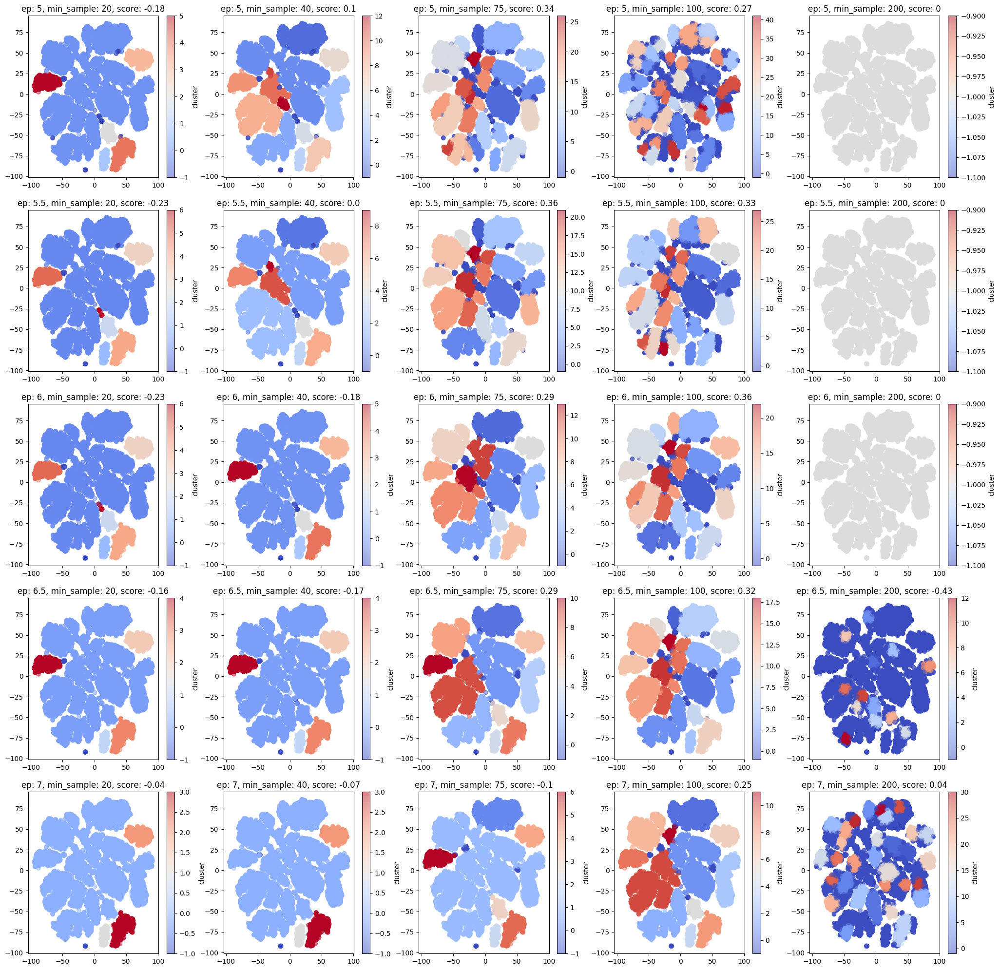

In [15]:
# Define parameters
eps = [5,5.5,6,6.5,7]
min_samples = [20,40,75,100,200]

all_combos = list(product(eps, min_samples))
num_combos = len(all_combos)

num_cols = 5
num_rows = (num_combos + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 5 * num_rows))
axes = axes.flatten()

for idx, (ep, min_sample) in enumerate(all_combos):
    ax = axes[idx]  # Get the correct subplot

    dbscan = DBSCAN(eps=ep, min_samples=min_sample)
    full_df['cluster'] = dbscan.fit_predict(X_tsne)
    try:
        score = round(float(metrics.silhouette_score(X_tsne, full_df['cluster'], metric='euclidean')), 2)
        if score > max_score:
            max_score = score
            max_vals = [ep, min_sample]
    except Exception as e:
        score = 0

    scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=full_df['cluster'], cmap='coolwarm', alpha=0.5)
    fig.colorbar(scatter, label='cluster', ax=ax)
    
    ax.set_title(f'ep: {ep}, min_sample: {min_sample}, score: {score}')

# Hide any unused subplots if they exist
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.show()


In [16]:
dbscan = DBSCAN(eps=6, min_samples=100)
full_df['cluster_dbscan_tsne'] = dbscan.fit_predict(X_tsne)
full_df['x_cord_tsne'] = X_tsne[:, 0]
full_df['y_cord_tsne'] = X_tsne[:, 1]

altair_df = full_df.sample(5000)

binary_scale = alt.Scale(domain=[0, 1], range=['blue', 'red'])
custom_scale = alt.Scale(scheme='category20')

chart = alt.Chart(altair_df).mark_circle().encode(
    x=alt.X('x_cord_tsne'),
    y=alt.Y('y_cord_tsne'),
    color=alt.Color('is_drafted:O', scale=binary_scale)
).properties(
    width=500,
    height=750
)

chart2 = alt.Chart(altair_df).mark_circle().encode(
    x=alt.X('x_cord_tsne'),
    y=alt.Y('y_cord_tsne'),
    color=alt.Color('cluster_dbscan_tsne:O', scale=custom_scale)
).properties(
    width=500,
    height=750
)

alt.hconcat(chart, chart2).resolve_scale(
    color='independent'
)

alt.HConcatChart(...)

In [17]:
cluster_summary = full_df.groupby('cluster_dbscan_tsne')['is_drafted'].agg(['sum', 'count'])
cluster_summary['proportion_drafted'] = cluster_summary['sum'] / cluster_summary['count']
cluster_summary = cluster_summary.sort_values('proportion_drafted', ascending=False)
cluster_summary

,sum,count,proportion_drafted
cluster_dbscan_tsne,,,
8,73.0,250,0.292000
15,73.0,263,0.277567
20,63.0,229,0.275109
18,100.0,380,0.263158
16,34.0,141,0.241135
21,108.0,491,0.219959
-1,54.0,435,0.124138
9,86.0,747,0.115127
22,18.0,186,0.096774


In [20]:
df_no_noise_tsne = full_df[full_df['cluster_dbscan_tsne'] != -1]

metrics.silhouette_score(df_no_noise_tsne[['x_cord_tsne', 'y_cord_tsne']], df_no_noise_tsne['cluster_dbscan_tsne'], metric='euclidean')

np.float32(0.38761744)

In [19]:
full_df.to_csv('../../data/dbscan_clusters.csv')